## Can we predict the outcome of a game based on the first 10 minutes?


##### Semester 4 personal challenge 2022 

Made by Megin van Herk

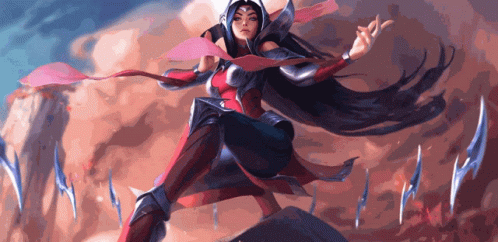

# Table of contents:
- Domain understanding
- Data sourcing
- Analytic approach

- ## Approach 1: Nearest neigbor, version 1
  - Data requirements
  - Data collection
  - Data understanding
  - Data preparation
  - Preparation
  - Modelling
  - Evaluation
- ## Approach 1: Nearest neigbor, Version 2
  - Data requirements
  - Data collection
  - Data understanding
  - Data preparation
  - Preparation
  - Modelling
  - Evaluation
- ## Approach 2: Logistic regression
  - Data requirements
  - Data collection
  - Data understanding
  - Data preparation
  - Preparation
  - Modelling
  - Evaluation
- ## Approach 3: SVM
  - Data requirements
  - Data collection
  - Data understanding
  - Data preparation
  - Preparation
  - Modelling
  - Evaluation
  
- Evaluation
- Collecting 
- Documenting
- Reporting

_______________________________________________________________________________________________________________________________

In [1]:
import numpy as np
import pandas as pd
import sklearn as sk
import matplotlib
import matplotlib.pyplot as plt
from IPython.display import display
import seaborn as sns
print('numpy version:', np.__version__)
print('pandas version:', pd.__version__)
print('scikit-learn version:', sk.__version__)
print('matplotlib version:', matplotlib.__version__)

%matplotlib inline

numpy version: 1.20.3
pandas version: 1.3.4
scikit-learn version: 0.24.2
matplotlib version: 3.4.3


## Domain understanding

League of Legends is one of the world's most popular video games, developed by Riot Games. It features a team-based competitive game mode based on strategy and outplaying opponents. Players work with their team to break the enemy Nexus before the enemy team breaks theirs.


A lot of different statistics go into a single game of league. Some seem to have more impact than others. People assume that if one team has more kills than the other, that team will win. But there is also objectives, such as turrets, monsters and minions. The amount of data actually impacting the winning of a game might surprise you.


This game also has a lovely option for you to surrender after 15 minutes, this usually happens when you know you’re not going to win anymore. Either the enemy has killed you a lot and you’re not having fun anymore or you just don’t think you can win this game. but of course, you never know if you can still turn the tides. There is always a chance that later in the game something might change and you will win the game. this is a gamble some people are not willing to make. “never surrender” is a commonly used term. but what if you know if you’re going to win or not. What if you had a program that showed you after a 10-minute duration of a game, what the chances are of you winning or not? This could save a lot of people a lot of time. and or motivate people to keep playing the game because they know their chances of winning


__________________________________________________

##### Very short summary of interview:

##### “Do you surrender your league of legends games a lot?”

50% of games are surrendered

##### “How often do you find yourself thinking you’re going to lose the game but end up winning anyway?”

most of the time we have surrendered by then so not very often.  if we don’t think were going to win, we can try to keep winning but it will take a lot of effort so rather surrender.

##### “if you were to know you’re percentage’s chance of being able to win the game, what kind of impact would this have on your surrender choice? for ex. 10 minutes into the game, a program would tell you that you have a 30% of winning. “

no effect, every minion can change the course of the game.

it would set people off to surrender more often

or give people a false sense of hope. 

I would not download this

##### “what if the application would tell you what to improve to win the game. ex. "If you get 3 more kills you chances of winning are 70%"”

this would motivate me to keep playing the game

I would download this

(For full manuscript view assignment "Investigative Problem Solving")
____________________________________________________
Conclusion of this interview is that the simple "Will you win or not?" question is too vague for the users, and they need a more specific reason. This will help them improve their skills.

### Why is this research needed? 
When you think you suck at a video game. you just keep losing, cant seem to win. it might motivate you just to quit. But what if you knew exactly what you needed to do to be able to win. That is why this research is needed. to motivate people to keep playing league of legends. Improve themselves. Improve the game.

### What is the goal of the project? 
The goal of the project is to help players improve themselves. Based on their own and other players games. Showing during or after a game a section in which a player can improve or a section they have mastered, can really motivate someone to do better and keep playing.
### Who is going to use our product? 
League player looking to improve their winrate, is my target user. It would be a best fit for beginner or intermediate players. Since well experienced people dont need to know their winrate, and since the accuracy of the program isnt 100%, experienced players probably know better themselves. Such as in the esports scheme, they have their own knowledge and coaches, so this project would not be meant for them.
### How will we reach the end product for the client? 
It could be possible to make an app using this data, making an ingame display to keep the user up to date with their stats. And their chances of winning. Based on the interview, its not enough to just show the win percentage. Its better to dive in deeper in to the stats and show the user "Why" they are winning or losing.  

## Data sourcing


In [2]:
df = pd.read_csv("league.csv")

The data is acquired from the official riot games API (the company behind league of legends) and therefore is accurate and reliable. 

[https://developer.riotgames.com/apis#account-v1](https://developer.riotgames.com/apis#account-v1)

About the dataset

This dataset contains info on the first 10 minutes of over 50k games. It contains all values that impact a game:

- Warding totem: An item that a player can put on the map to reveal the nearby area. Very useful for map/objectives control.
- Minions: NPC that belong to both teams. They give gold when killed by players.
- Jungle minions: NPC that belong to NO TEAM. They give gold and buffs when killed by players.
- Elite monsters: Monsters with high hp/damage that give a massive bonus (gold/XP/stats) when killed by a team.
- Dragons: Elite monster which gives team bonus when killed. The 4th dragon killed by a team gives a massive stats bonus. The 5th dragon (Elder Dragon) offers a huge advantage to the team.
- Herald: Elite monster which gives stats bonus when killed by the player. It helps to push a lane and destroys structures.
- Towers: Structures you have to destroy to reach the enemy Nexus. They give gold.
- Level: Champion level. Start at 1. Max is 18.



In [4]:
plt.style.use('seaborn')

In [23]:
df

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,...,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,...,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,...,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,...,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,...,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,...,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9874,4527873286,1,17,2,1,7,4,5,1,1,...,0,15246,6.8,16498,229,34,-2519,-2469,22.9,1524.6
9875,4527797466,1,54,0,0,6,4,8,1,1,...,0,15456,7.0,18367,206,56,-782,-888,20.6,1545.6
9876,4527713716,0,23,1,0,6,7,5,0,0,...,0,18319,7.4,19909,261,60,2416,1877,26.1,1831.9
9877,4527628313,0,14,4,1,2,3,3,1,1,...,0,15298,7.2,18314,247,40,839,1085,24.7,1529.8


## Analytic approach

The type of problem, at first sight, is classification, “Will I win or lose?”. A regression algorithm could fit as well, asking questions like “how many kills do I need to win?”, “how much am I allowed to die to not lose?”. we will try both to see which one works best. 


# Approach 1, Version 1:

nearest neighbor

## Data requirements

For nearest neighbor we require a target vairbale, we will use bluewins.

Since this dataset includes both red team and blue teams data, its double up, because if blue loses the game, red automatically wins the game. so we dont need both the teams data. for now we will be focusing on the blue teams data.

To better understand you dataset, it good to plot some graphs to visualize everything a bit better for your own understanding

no NaN values👍 

## Data collection

In [24]:
stats = df[['blueWins','blueWardsPlaced','blueFirstBlood','blueKills','blueDeaths','blueAssists','blueEliteMonsters','blueDragons']]
stats.columns

Index(['blueWins', 'blueWardsPlaced', 'blueFirstBlood', 'blueKills',
       'blueDeaths', 'blueAssists', 'blueEliteMonsters', 'blueDragons'],
      dtype='object')

## Data understanding

To better understand you dataset, it good to plot some graphs to visualize everything a bit better for your own understanding

In [25]:
from sklearn import preprocessing

scaler = preprocessing.MinMaxScaler()
names = stats.columns
norm = scaler.fit_transform(stats)
norm_stats = pd.DataFrame(norm, columns=names)
norm_stats.head()


,blueWins,blueWardsPlaced,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons
0,0.0,0.093878,1.0,0.409091,0.272727,0.379310,0.0,0.0
1,0.0,0.028571,0.0,0.227273,0.227273,0.172414,0.0,0.0
2,0.0,0.040816,0.0,0.318182,0.500000,0.137931,0.5,1.0
3,0.0,0.155102,0.0,0.181818,0.227273,0.172414,0.5,0.0
4,0.0,0.285714,0.0,0.272727,0.272727,0.206897,0.0,0.0


When we dont use normalized data we cant actually read any of the values properly. when normalized you can see the clear lines connection, when not normalized its just one big blob.

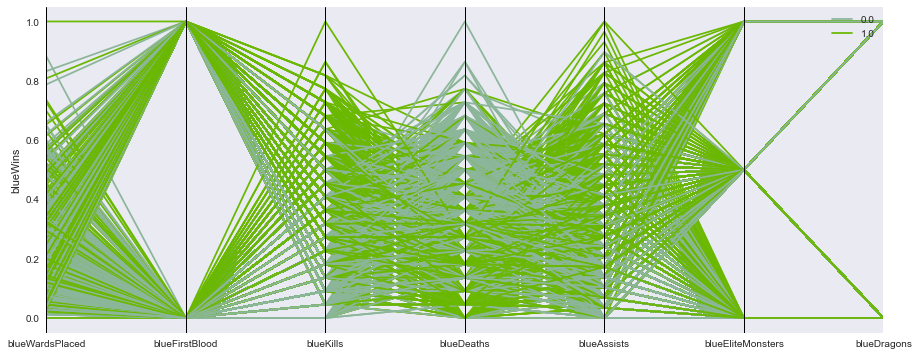

In [26]:
fig = plt.figure(figsize=[15,6])
from pandas.plotting import parallel_coordinates
ax = parallel_coordinates(norm_stats,'blueWins')
ax.set_ylabel('blueWins');
plt.show()

This parralel coordinate gives you allot of information. for example, you can see if you get more kills you have less deaths, and ofcourse if you have less kills you have more deaths, and allot more loss(o) when you have more deaths

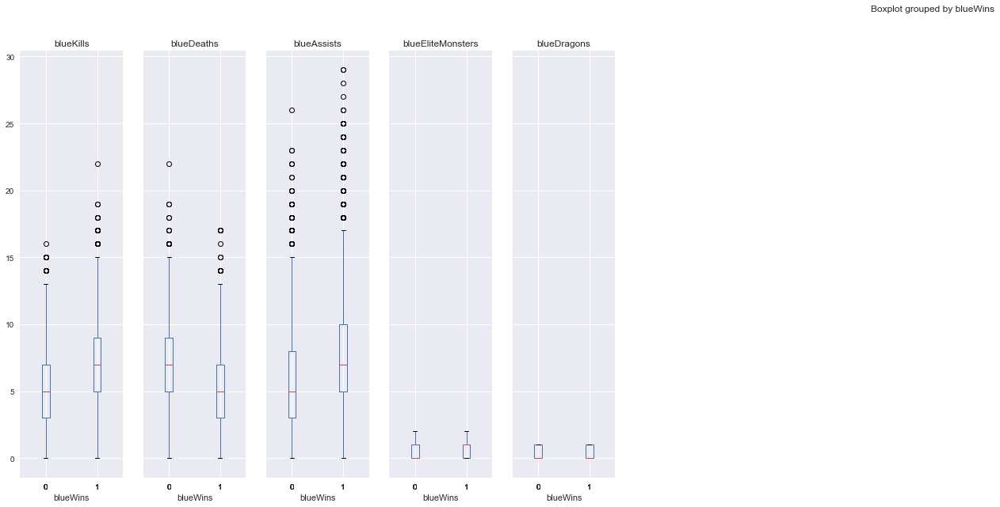

In [27]:
features = tuple(df.columns[5:10].values)
df.boxplot(column=features, by='blueWins', figsize=(40,10), layout=(1,15));
#here we are boxplotting the data to visualize and see with which variable we could best use our machine learning on
#We compare if blue wins(1) or not (0), bad choice of variable would we for exmaple blueEliteMonsters and blueDragons.

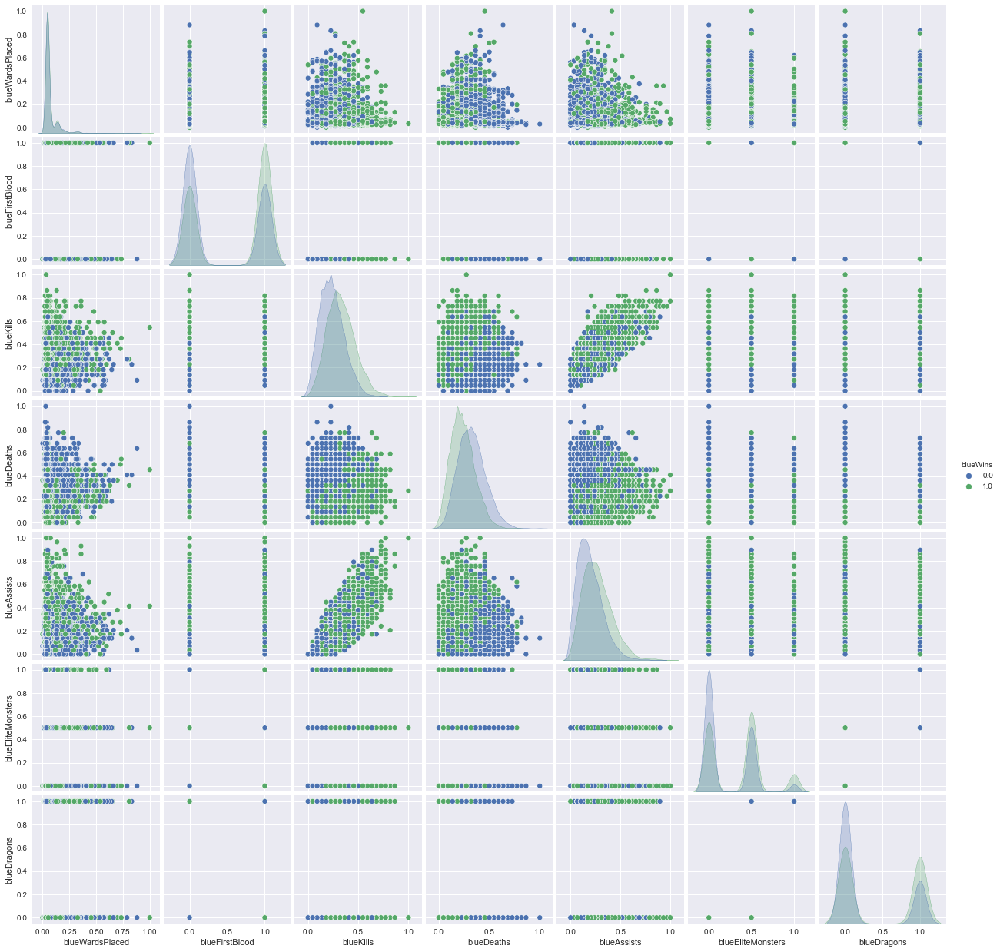

In [28]:
import seaborn as sns
sns.pairplot(norm_stats, hue="blueWins")

To better visualize the data and see which variables are usable, you can plot a pairplot, here you can see all of the collumns compared to one another. BY looking at the scattter plots, you can tell which one has the better compatilibilty with nearest neighbor. if the blue and ornage dots are totally scattered throughour eachother its not a good choice. for example. blueAssist with blueWardsplaced looks very chaotic and nearest neighbor wont work on this, the accuracy would be very low. compared with blueDeaths with blueKills, you can clearly differentiate the two colors, there for this one would be a nice choice for nearest neighbor.

For now we will go with blueKills and blueDeaths, since blueAssist has allot of outliers. So we will check if the amount of kills and deaths a teams gets in the first 10 minutes of a game, can predict if the team wins or loses.

## Data preparation

###  Selecting features (and scaling them)
We will select the two features and scale each feature linearly with standard scaler.

In [29]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn import metrics

wins: [0 1]
The length of X_stats: 9879


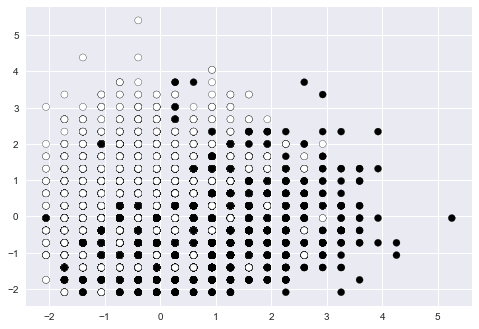

In [30]:
# Define X_iris and y_iris
X_stats = df[['blueKills', 'blueDeaths']]
y_stats = df['blueWins']
print('wins:', df['blueWins'].unique())

# Normalize
scaler_stats = StandardScaler().fit(X_stats)
X_stats = scaler_stats.transform(X_stats)
print('The length of X_stats: {}'.format(len(X_stats)))

plt.scatter(X_stats[:,0], X_stats[:,1], edgecolors='black', c=y_stats)

#### Dividing your data into a training and test set

In [31]:
X_train_stats, X_test_stats, y_train_stats, y_test_stats = train_test_split(X_stats, y_stats, test_size=0.25)
print('Train shape:', X_train_stats.shape, y_train_stats.shape)
print('Test shape:', X_test_stats.shape, y_test_stats.shape)

Train shape: (7409, 2) (7409,)
Test shape: (2470, 2) (2470,)


## Preparation

## Modelling

In [32]:
from sklearn.neighbors import KNeighborsClassifier

In [33]:
## we create an instance of Neighbours Classifier and fit the data.
clf_stats = KNeighborsClassifier(5)
clf_stats.fit(X_train_stats, y_train_stats)

KNeighborsClassifier()

In [34]:
#Evaluate performance (with test set)
print('Number of test points: ',X_test_stats.size)
y_pred_stats = clf_stats.predict(X_test_stats)

Number of test points:  4940


In [35]:
metrics.accuracy_score(y_test_stats, y_pred_stats)

0.671255060728745

## Evaluation

0.67 accuracy is not bad

----------

# Approach 1, Version 2:

## Data requirements

The type of problem, at first sight, is classification, “Will I win or lose?”. A regression algorithm could fit as well, asking questions like “how many kills do I need to win?”, “how much am I allowed to die to not lose?”. we will try both to see which one works best. 

our target variable is if we win or lose, this variable is stored in both “blueWins” and “redWins”. if blue wins the game it will be “blueWins=1, redWins = 0”.  You need only use 1, if you know blueWins= 0  then you can presume redWins = 1. so we only use “blueWins” as our target variable.

Later on, we look if choosing “redWins” and all attached data, makes a difference.

## Data collection

In [36]:
stats = df[['blueWins','blueWardsPlaced','blueFirstBlood','blueKills','blueDeaths','blueAssists','blueEliteMonsters','blueDragons','blueHeralds','blueTowersDestroyed','blueTotalGold','blueAvgLevel','blueTotalExperience','blueTotalMinionsKilled','blueTotalJungleMinionsKilled','blueGoldDiff','blueExperienceDiff','blueExperienceDiff','blueCSPerMin','blueGoldPerMin']]
stats.columns

Index(['blueWins', 'blueWardsPlaced', 'blueFirstBlood', 'blueKills',
       'blueDeaths', 'blueAssists', 'blueEliteMonsters', 'blueDragons',
       'blueHeralds', 'blueTowersDestroyed', 'blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueExperienceDiff', 'blueCSPerMin', 'blueGoldPerMin'],
      dtype='object')

Since this dataset includes both red team and blue teams data, its double up, because if blue loses the game, red automatically wins the game. so we dont need both the teams data. for now we will be focusing on the blue teams data.

## Data understanding

To better understand the dataset, it is good to plot some graphs to visualize everything a bit better for your own understanding. When we dont use normalized data we cant actually read any of the values properly. when normalized you can see the clear lines connection, when not normalized its just one big blob. Putting everything on the same scale gives a better overview. 

In [37]:
from sklearn import preprocessing

scaler = preprocessing.MinMaxScaler()
names = stats.columns
norm = scaler.fit_transform(stats)
norm_stats = pd.DataFrame(norm, columns=names)
norm_stats.head()

,blueWins,blueWardsPlaced,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalExperience,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,blueExperienceDiff,blueCSPerMin,blueGoldPerMin
0,0.0,0.093878,1.0,0.409091,0.272727,0.379310,0.0,0.0,0.0,0.0,0.499576,0.588235,0.572406,0.544041,0.391304,0.514554,0.527402,0.527402,0.544041,0.499576
1,0.0,0.028571,0.0,0.227273,0.227273,0.172414,0.0,0.0,0.0,0.0,0.306993,0.588235,0.508577,0.435233,0.467391,0.355294,0.461512,0.461512,0.435233,0.306993
2,0.0,0.040816,0.0,0.318182,0.500000,0.137931,0.5,1.0,0.0,0.0,0.415003,0.529412,0.504948,0.497409,0.500000,0.433152,0.469430,0.469430,0.497409,0.415003
3,0.0,0.155102,0.0,0.181818,0.227273,0.172414,0.5,0.0,1.0,0.0,0.341300,0.705882,0.647864,0.575130,0.597826,0.426470,0.527459,0.527459,0.575130,0.341300
4,0.0,0.285714,0.0,0.272727,0.272727,0.206897,0.0,0.0,0.0,0.0,0.437129,0.705882,0.696437,0.621762,0.619565,0.440687,0.540863,0.540863,0.621762,0.437129


<Figure size 576x396 with 0 Axes>

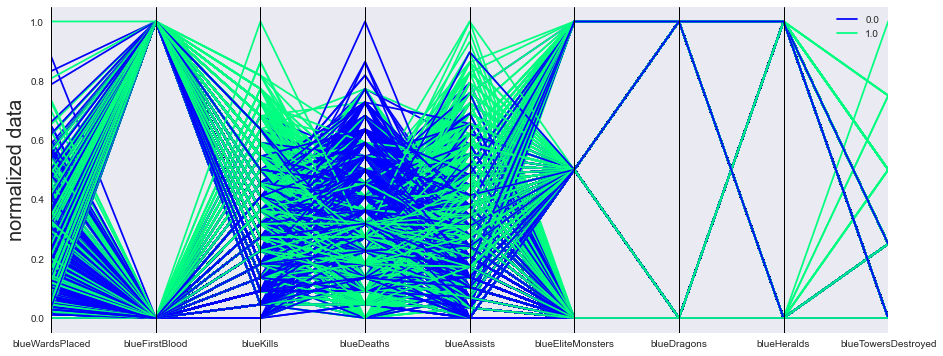

In [38]:
from pandas.plotting import parallel_coordinates
plt.figure();
fig = plt.figure(figsize=[15,6])
from pandas.plotting import parallel_coordinates
#I had to split the collumns into 2 parts or else the graph wasnt readable anymore
part1 = norm_stats[['blueWins','blueWardsPlaced','blueFirstBlood','blueKills','blueDeaths','blueAssists','blueEliteMonsters','blueDragons','blueHeralds','blueTowersDestroyed']]
part2 = norm_stats[['blueWins', 'blueTotalGold','blueAvgLevel','blueTotalExperience','blueTotalMinionsKilled','blueTotalJungleMinionsKilled','blueGoldDiff','blueExperienceDiff','blueExperienceDiff','blueCSPerMin','blueGoldPerMin']]

ax = parallel_coordinates(part1,'blueWins', colormap="winter")
ax.set_ylabel('normalized data', fontsize=20);

This parralel coordinate gives you allot of information. for example, you can see if you get more kills you have less deaths, and ofcourse if you have less kills you have more deaths, and allot more loss(o) when you have more deaths

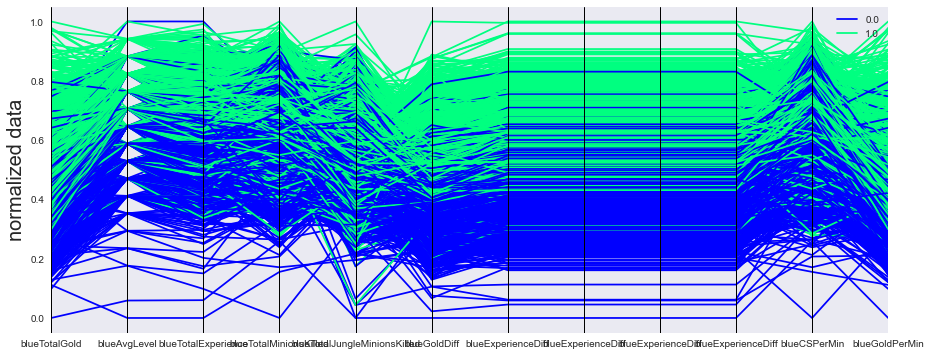

In [39]:
fig = plt.figure(figsize=[15,6])
ax = parallel_coordinates(part2,'blueWins', colormap="winter")
ax.set_ylabel('normalized data', fontsize=20);

In this plot you can clearly see a divide between win and lose. With these collumns its more beneficial to have "more", such as more gold, more levels, to win the game.

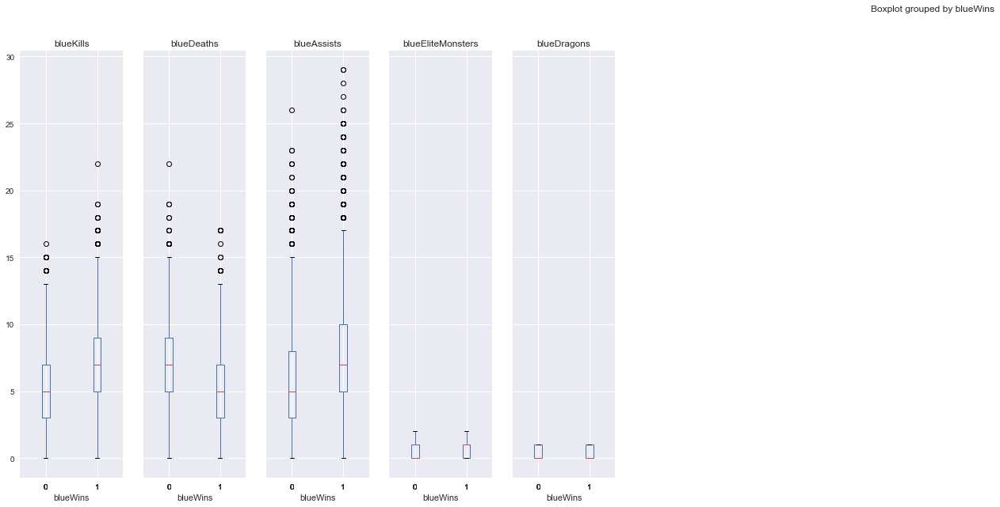

In [40]:
features = tuple(df.columns[5:10].values)
df.boxplot(column=features, by='blueWins', figsize=(40,10), layout=(1,15));
#here we are boxplotting the data to visualize and see with which variable we could best use our machine learning on
#We compare if blue wins(1) or not (0), bad choice of variable would we for exmaple blueEliteMonsters and blueDragons.

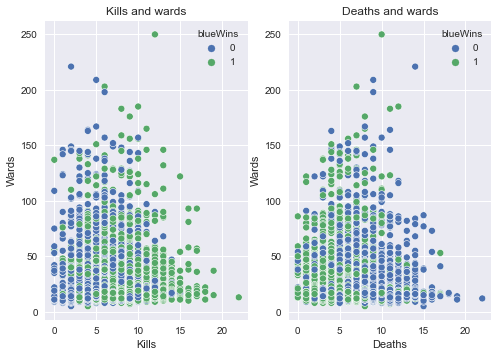

In [41]:
plt.subplot(1, 2, 1) # row 1, col 2 index 1
sns.scatterplot(data=stats, x="blueKills", y="blueWardsPlaced", hue="blueWins")
plt.title("Kills and wards")
plt.xlabel('Kills')
plt.ylabel('Wards')

plt.subplot(1, 2, 2) # index 2
sns.scatterplot(data=stats, x="blueDeaths", y="blueWardsPlaced", hue="blueWins")
plt.title("Deaths and wards")
plt.xlabel('Deaths')
plt.ylabel('Wards')
plt.show()

in this scatterplot it tells us wards placed(Vision over the map) and kills compared. in the game it makes sense that if you can see the enemy you can kill the enemy more. this scatterplot also states that, as you can see the lesser wards the more blue(o) losses there are. but its not completely accurate, even if they placed allot of wards you can still lose. But will you die more when having less visions? the plot next to this one shows deaths and wards. The more wins is on the left side of the scatter plot when they have lesser deaths, which makes sense. it seems to not matter how many wards a team gets for them to win or not. You can see the clear divison between winning and losing but its based manily on kills and deaths, wards doesnt seem to have an impact on this. Deaths and kills have a much higher impact on the outcome of the game. So we will focus on those.

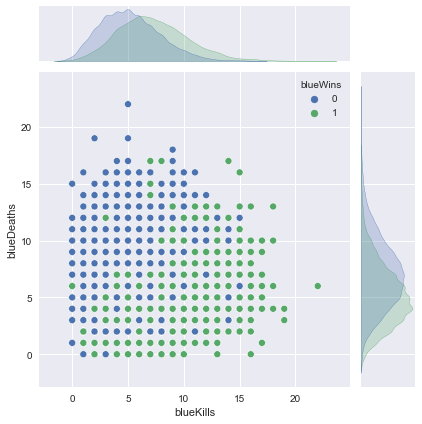

In [42]:
sns.jointplot(data=stats, x="blueKills", y="blueDeaths", hue="blueWins")

Here you can clearly see the line between win and los, exluding the outlier ofcourse. The more deaths and less kills the more likely you are to loose. and the more kills and less deaths the more likely you are to win.

I think these variables are best to perform our machine learning on, since they seem to impact the game the most. ofcourse we shouldnt disregard all the other variables, so below is a pairplot with all the variables to see which other ones might be good to use aswell.

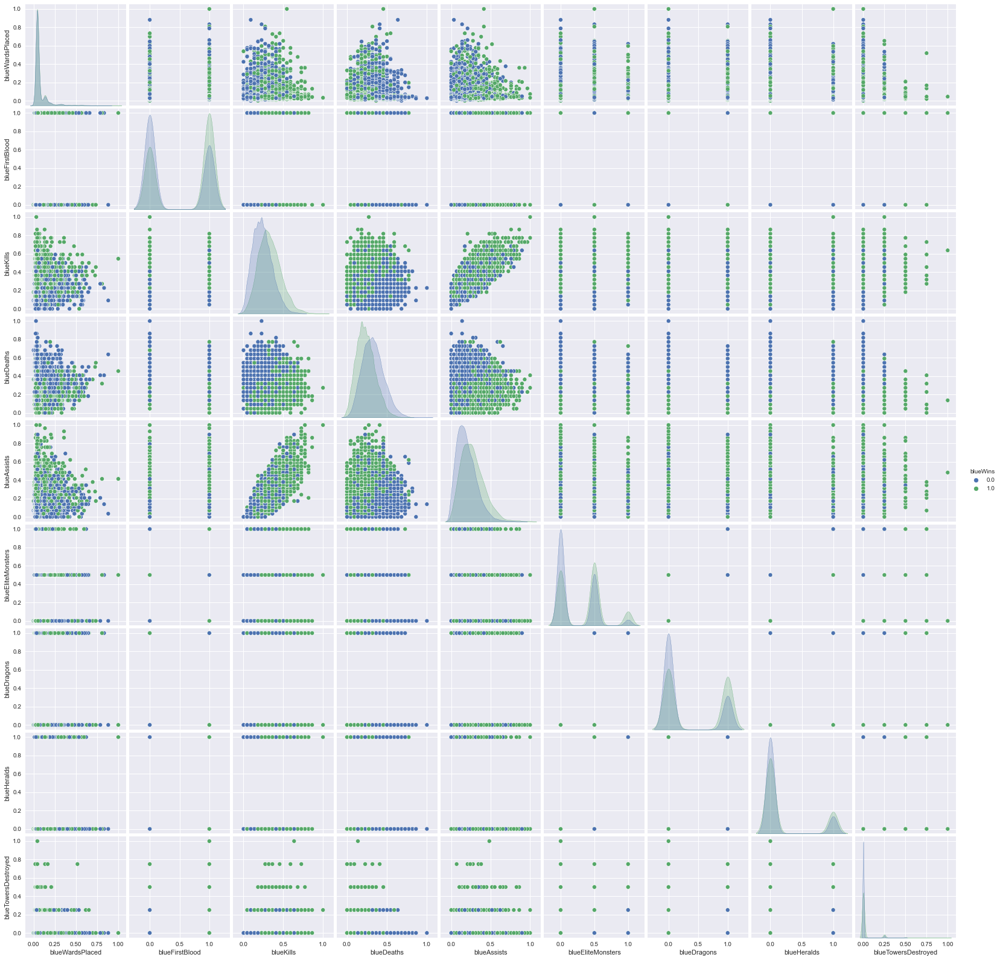

In [44]:
import seaborn as sns
sns.pairplot(part1, hue="blueWins")

## Data preparation

In [46]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn import metrics

## Preparation

wins: [0 1]
The length of X_stats: 9879


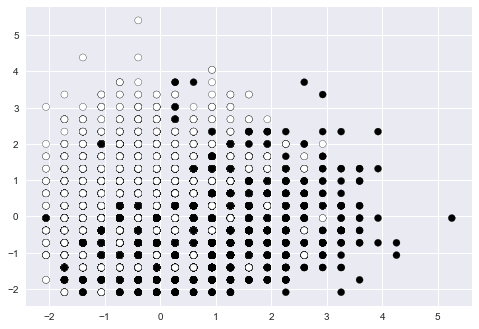

In [47]:
# Define X_iris and y_iris
X_stats = df[['blueKills', 'blueDeaths']]
y_stats = df['blueWins']
print('wins:', df['blueWins'].unique())

# Normalize
scaler_stats = StandardScaler().fit(X_stats)
X_stats = scaler_stats.transform(X_stats)
print('The length of X_stats: {}'.format(len(X_stats)))

plt.scatter(X_stats[:,0], X_stats[:,1], edgecolors='black', c=y_stats)

In [48]:
X_train_stats, X_test_stats, y_train_stats, y_test_stats = train_test_split(X_stats, y_stats, test_size=0.25)
print('Train shape:', X_train_stats.shape, y_train_stats.shape)
print('Test shape:', X_test_stats.shape, y_test_stats.shape)

Train shape: (7409, 2) (7409,)
Test shape: (2470, 2) (2470,)


## Modelling

In [49]:
from sklearn.neighbors import KNeighborsClassifier

In [50]:
## we create an instance of Neighbours Classifier and fit the data.
clf_stats = KNeighborsClassifier(5)
clf_stats.fit(X_train_stats, y_train_stats)

KNeighborsClassifier()

In [51]:
#Evaluate performance (with test set)
print('Number of test points: ',X_test_stats.size)
y_pred_stats = clf_stats.predict(X_test_stats)

Number of test points:  4940


In [52]:
metrics.accuracy_score(y_test_stats, y_pred_stats)

0.6502024291497975

## Evaluation

0.65 accuracy

# Approach 2

#### logistic regression

## Data requirements


From the data, we can see that the outcome of a game is binary: the winner is denoted by either a 0 (blue team) or a 1 (red team). Using the data from different aspects of the game, we want to be able to predict who will win the game.

Because of the binary nature of the outcome we want to predict, we will use logistic regression to produce an output that will always be in between 0 and 1, and will allow it to correctly predict who will win.

## Data collection


In [16]:
df.columns

Index(['gameId', 'blueWins', 'blueWardsPlaced', 'blueWardsDestroyed',
       'blueFirstBlood', 'blueKills', 'blueDeaths', 'blueAssists',
       'blueEliteMonsters', 'blueDragons', 'blueHeralds',
       'blueTowersDestroyed', 'blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
       'redFirstBlood', 'redKills', 'redDeaths', 'redAssists',
       'redEliteMonsters', 'redDragons', 'redHeralds', 'redTowersDestroyed',
       'redTotalGold', 'redAvgLevel', 'redTotalExperience',
       'redTotalMinionsKilled', 'redTotalJungleMinionsKilled', 'redGoldDiff',
       'redExperienceDiff', 'redCSPerMin', 'redGoldPerMin'],
      dtype='object')

In [18]:
data = df[['blueWardsPlaced', 'blueWardsDestroyed',
       'blueFirstBlood', 'blueKills', 'blueDeaths', 'blueAssists',
       'blueEliteMonsters', 'blueDragons', 'blueHeralds',
       'blueTowersDestroyed', 'blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
       'redFirstBlood', 'redKills', 'redDeaths', 'redAssists',
       'redEliteMonsters', 'redDragons', 'redHeralds', 'redTowersDestroyed',
       'redTotalGold', 'redAvgLevel', 'redTotalExperience',
       'redTotalMinionsKilled', 'redTotalJungleMinionsKilled', 'redGoldDiff',
       'redExperienceDiff', 'redCSPerMin', 'redGoldPerMin']]

We will use all columns, excluding gameID and blueWins, blueWins is our target variable.

## Data understanding


<AxesSubplot:>

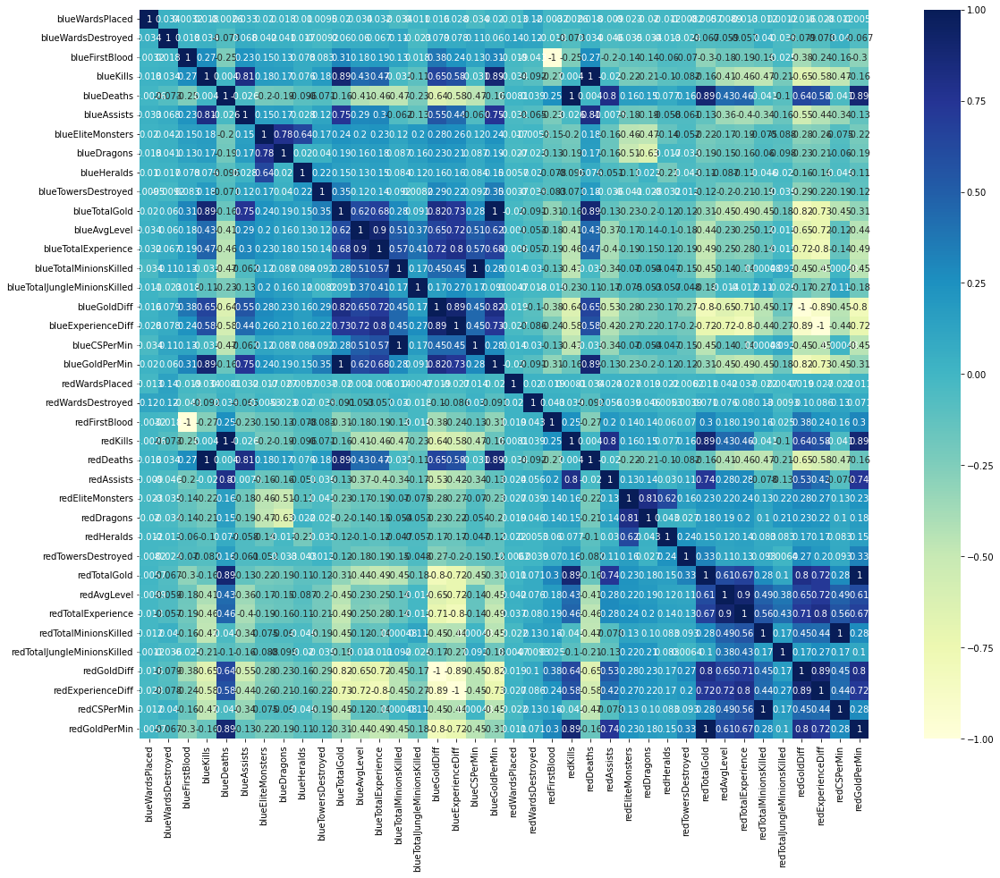

In [36]:
fig = plt.figure(figsize=(22,15))
sns.heatmap(data[['blueWardsPlaced', 'blueWardsDestroyed',
       'blueFirstBlood', 'blueKills', 'blueDeaths', 'blueAssists',
       'blueEliteMonsters', 'blueDragons', 'blueHeralds',
       'blueTowersDestroyed', 'blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
       'redFirstBlood', 'redKills', 'redDeaths', 'redAssists',
       'redEliteMonsters', 'redDragons', 'redHeralds', 'redTowersDestroyed',
       'redTotalGold', 'redAvgLevel', 'redTotalExperience',
       'redTotalMinionsKilled', 'redTotalJungleMinionsKilled', 'redGoldDiff',
       'redExperienceDiff', 'redCSPerMin', 'redGoldPerMin']].corr(),annot=True,square=True, cmap="YlGnBu")

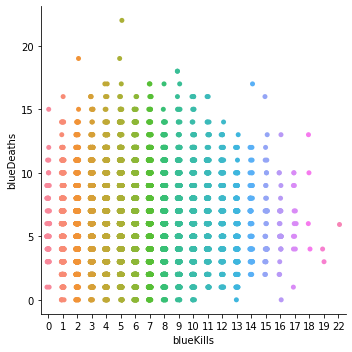

In [41]:
dts = df[['blueKills', 'redKills', 'blueDeaths', 'redDeaths']]

sns.catplot(x='blueKills', y="blueDeaths", data=df)

## Data preparation


### Logistic regression

Logistic regression is a statistical method for predicting binary classes. The outcome or target variable is dichotomous in nature. Dichotomous means there are only two possible classes. In this case our "blueWins" is either 1 or 0.

It is a special case of linear regression where the target variable is categorical in nature. It uses a log of odds as the dependent variable. Logistic Regression predicts the probability of occurrence of a binary event utilizing a logit function.

In [37]:
from sklearn.linear_model import LogisticRegression

In [38]:
X =  df[['blueDeaths']]
y = df['blueWins']
clf = LogisticRegression(random_state=42).fit(X, y)

In [39]:
 clf.predict(X)

array([1, 1, 0, ..., 0, 1, 1], dtype=int64)

In [40]:
clf.predict_proba(X)

array([[0.4955134 , 0.5044866 ],
       [0.43019528, 0.56980472],
       [0.78542926, 0.21457074],
       ...,
       [0.56098502, 0.43901498],
       [0.30847264, 0.69152736],
       [0.4955134 , 0.5044866 ]])

In [41]:
 clf.score(X, y)

0.6404494382022472

_______________________________________________________________________________________________________________________________

##### Trying out different variables and their accuracy scores:


In [52]:
X =  df[['blueWardsPlaced']]
y = df['blueWins']
clf = LogisticRegression(random_state=42).fit(X, y)
clf.score(X, y)

0.5009616357930965

In [53]:
X =  df[['blueFirstBlood']]
y = df['blueWins']
clf = LogisticRegression(random_state=42).fit(X, y)
clf.score(X, y)

0.6008705334548031

In [54]:
X =  df[['blueKills']]
y = df['blueWins']
clf = LogisticRegression(random_state=42).fit(X, y)
clf.score(X, y)

0.6356918716469279

In [55]:
X =  df[['blueAssists']]
y = df['blueWins']
clf = LogisticRegression(random_state=42).fit(X, y)
clf.score(X, y)

0.6159530316833688

_______________________________________________________________________________________________________________________________

<AxesSubplot:xlabel='blueDeaths', ylabel='blueWins'>

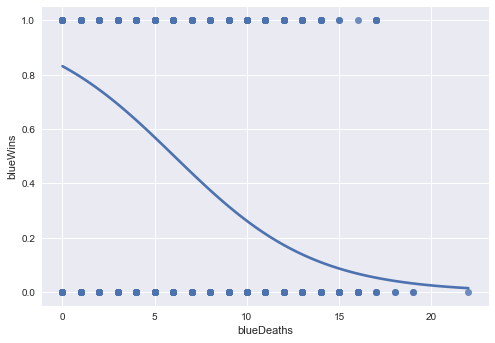

In [56]:
x =   df[['blueDeaths']]
y = df['blueWins']

#plot logistic regression curve
sns.regplot(x=x, y=y, data=stats, logistic=True, ci=None)

<AxesSubplot:xlabel='blueKills', ylabel='blueWins'>

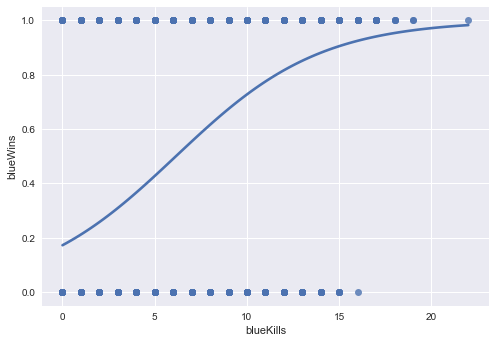

In [7]:
x =   df[['blueKills']]
y = df['blueWins']

#plot logistic regression curve
sns.regplot(x=x, y=y, data=df, logistic=True, ci=None)

## Modelling

In [4]:
from sklearn.model_selection import train_test_split

In [25]:
X = df[['blueKills', 'redKills', 'blueDeaths', 'redDeaths']]
y = df['blueWins']

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=101)

In [27]:
from sklearn.linear_model import LogisticRegression
logmodel = LogisticRegression()
logmodel.fit(X_train, y_train)

LogisticRegression()

In [28]:
predictions = logmodel.predict(X_test)

## Evaluation

In [29]:
from sklearn.metrics import classification_report

In [30]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.68      0.74      0.71      1623
           1       0.72      0.66      0.69      1638

    accuracy                           0.70      3261
   macro avg       0.70      0.70      0.70      3261
weighted avg       0.70      0.70      0.70      3261



# Approach 3:

SVMs with sigmoid kerne

• Support vectors are the data points that lie closest
to the decision surface (or hyperplane)
• They are the data points most difficult to classify
• They have direct bearing

SVMs maximize the margin
(Winston terminology: the ‘street’)
around the separating hyperplane.
• The decision function is fully
specified by a (usually very small)
subset of training samples, the
support vectors.
• This becomes a Quadratic
programming problem that is easy
to solve by standard methods

info gathered from: https://www.javatpoint.com/machine-learning-support-vector-machine-algorithm

## Data requirements

## Data collection

## Data understanding

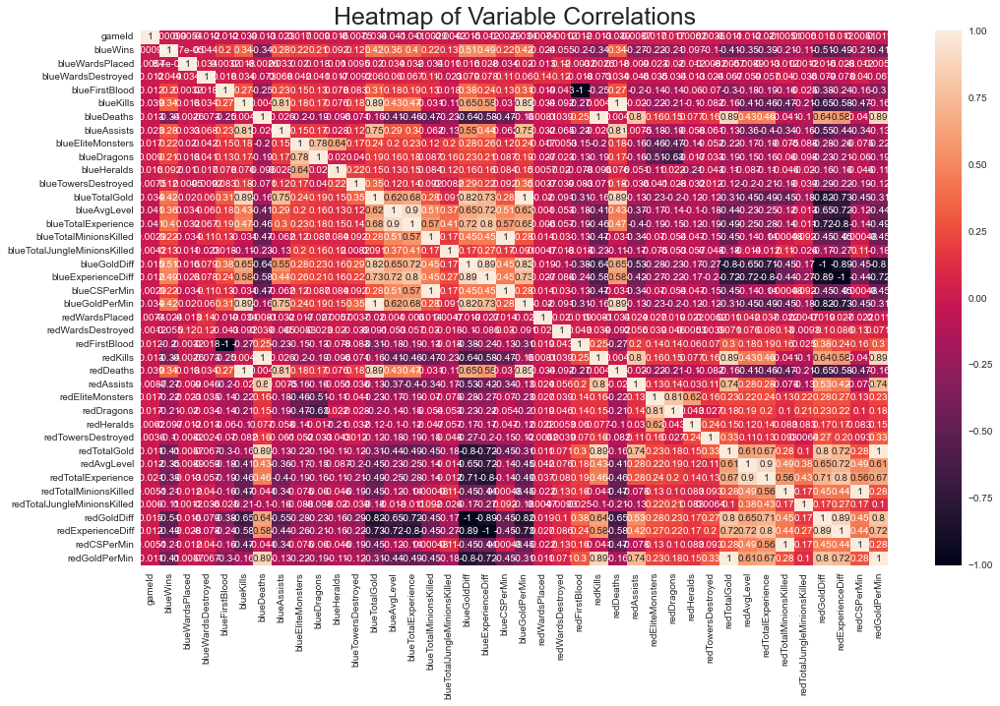

In [53]:
plt.figure(figsize=(17,10))
sns.heatmap(df.corr(),annot=True)
plt.title('Heatmap of Variable Correlations',fontsize=25)
plt.show()

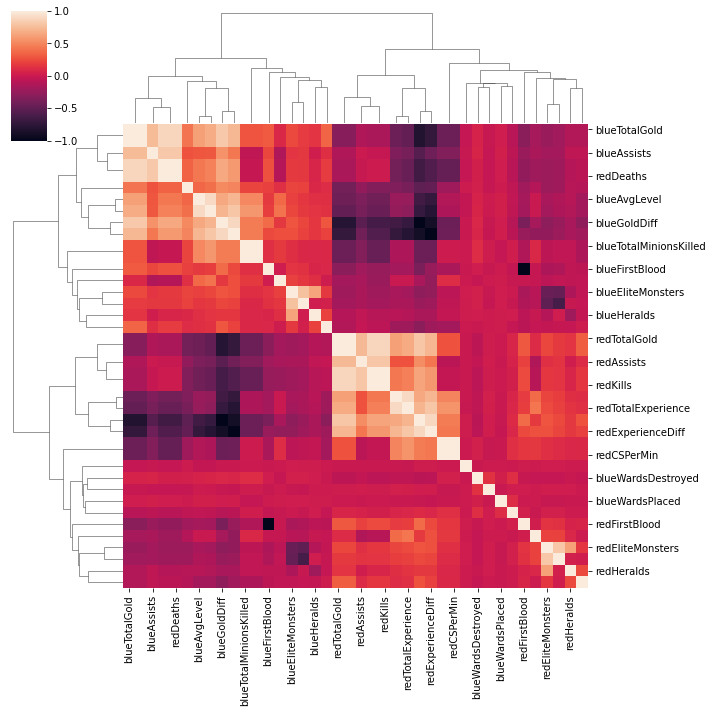

In [3]:
sns.clustermap(df.corr())

<AxesSubplot:xlabel='count', ylabel='blueWins'>

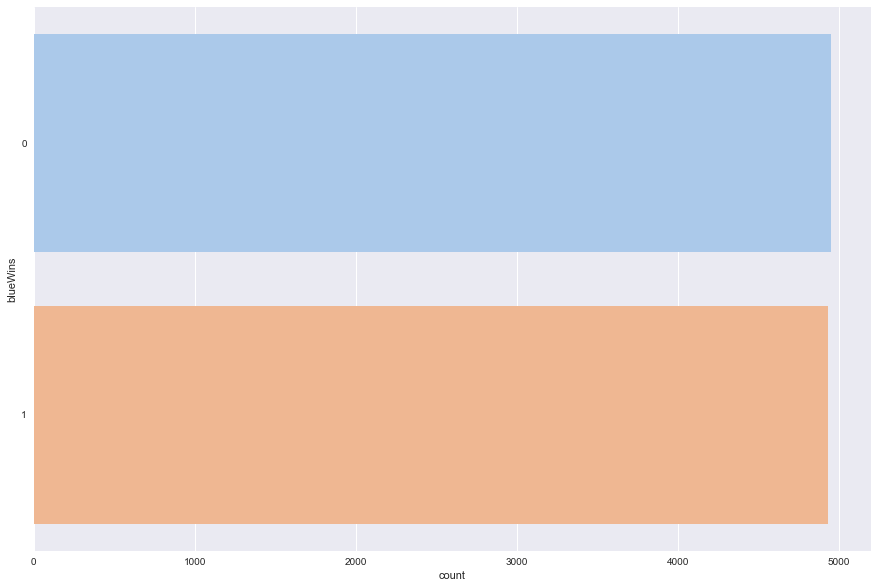

In [54]:
f, ax = plt.subplots(figsize=(15, 10))
sns.countplot(y="blueWins", data=df,
            palette="pastel")

The above graph shows that our data is equally distributed, the same amount of losses as there are wins.

<AxesSubplot:xlabel='blueWins', ylabel='blueKills'>

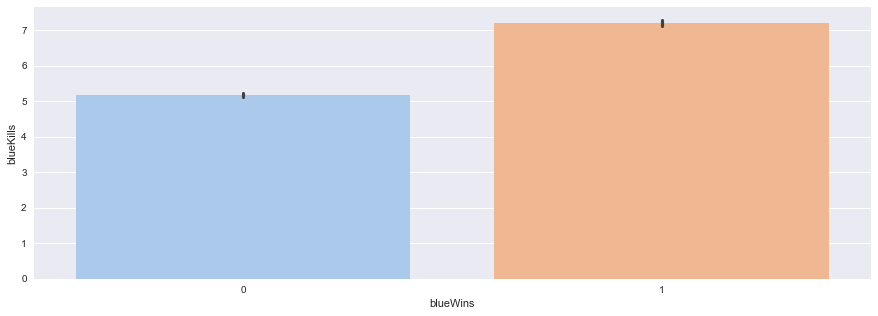

In [55]:
plt.figure(figsize=(15,5))
sns.barplot(x='blueWins',y='blueKills',data=df,
            palette="pastel")

Here we see that the more kills you have, the higher chance of you winning the game.

<AxesSubplot:xlabel='blueWins', ylabel='blueDeaths'>

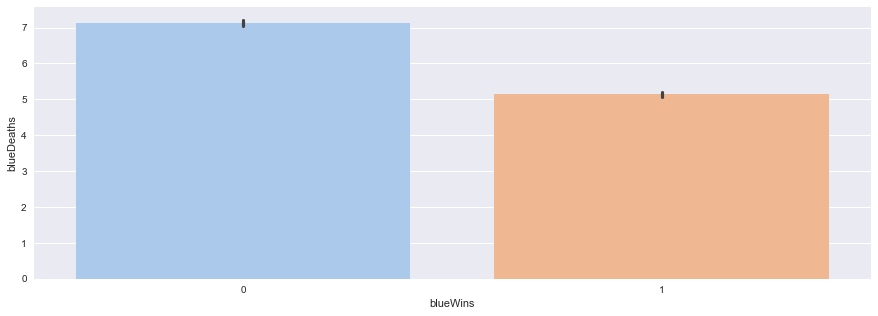

In [56]:
plt.figure(figsize=(15,5))
sns.barplot(x='blueWins',y='blueDeaths',data=df,
            palette="pastel")

here we see that the more deaths you have, the higher chance of you losing

Text(0.5, 1.0, 'blueKills vs redKIlls vs blueWins')

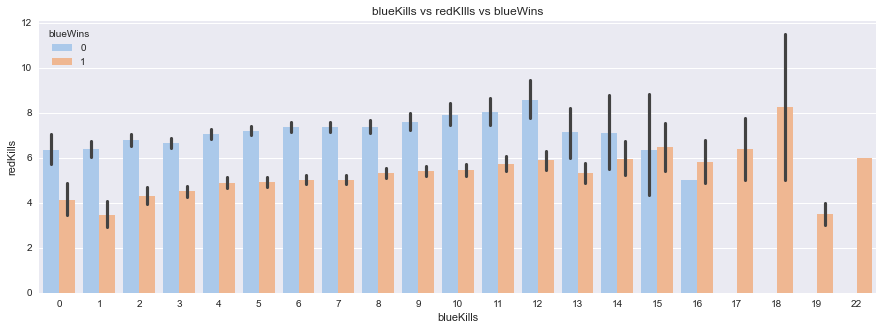

In [57]:
plt.figure(figsize=(15,5))
sns.barplot(x='blueKills',y='redKills',hue='blueWins',data=df,
            palette="pastel")
plt.title('blueKills vs redKIlls vs blueWins')


In this graph you can see that most amount of kills have both wins and loss, but at some point, when a high number of kills is reached, the team stops losing the game.

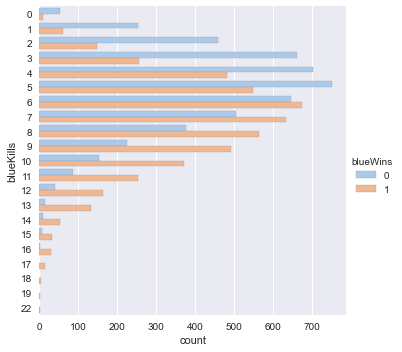

In [58]:
sns.catplot(y="blueKills", hue="blueWins", kind="count",
            palette="pastel", edgecolor=".6",
            data=df)

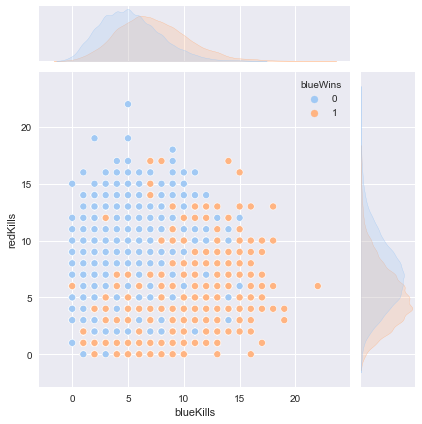

In [13]:
sns.jointplot(data=df, x="blueKills", y="redKills", hue="blueWins",  palette="pastel")

## Data preparation

In [1]:
import numpy as nm  
import matplotlib.pyplot as mtp  
import pandas as pd  

In [14]:
x= df[['blueKills','redKills']]
y= df['blueWins']

In [15]:
# Splitting the dataset into training and test set.  
from sklearn.model_selection import train_test_split  
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.25, random_state=0)  
#feature Scaling  
from sklearn.preprocessing import StandardScaler    
st_x= StandardScaler()    
x_train= st_x.fit_transform(x_train)    
x_test= st_x.transform(x_test)       

## Modelling

In [42]:
from sklearn.svm import SVC # "Support vector classifier"  
classifier = SVC(kernel='sigmoid', random_state=0)  
classifier.fit(x_train, y_train)  

SVC(kernel='sigmoid', random_state=0)

In [43]:
#Predicting the test set result  
y_pred= classifier.predict(x_test)  

In [44]:
from sklearn.metrics import accuracy_score
acc = accuracy_score(y_test, y_pred)
print(acc)

0.5983805668016194


## Evaluation

In [45]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred, zero_division=0))

              precision    recall  f1-score   support

           0       0.61      0.59      0.60      1250
           1       0.59      0.61      0.60      1220

    accuracy                           0.60      2470
   macro avg       0.60      0.60      0.60      2470
weighted avg       0.60      0.60      0.60      2470



--------------------------------------------------------------

## Collecting

## Documenting

## Reporting

_______________________________________________________________________________________________________________________________